### Cell 1: Install Dependencies We need the Hugging Face ecosystem (transformers, datasets) and an accelerator library.

In [ ]:
!pip install -q transformers datasets accelerate torch torchvision evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 8.3 MB/s eta 0:00:00


### Cell 2: Import Libraries Set up the environment and select the device (GPU is highly recommended).

In [ ]:
import torch
import numpy as np
import evaluate  # NEW: Import evaluate library
from datasets import load_dataset # Removed load_metric
from transformers import ViTImageProcessor, ViTForImageClassification, TrainingArguments, Trainer
from torchvision.transforms import (
    Compose, Normalize, RandomHorizontalFlip, RandomResizedCrop, Resize, ToTensor
)

# Check for GPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


### Cell 3: Load the "Robotics" Dataset We load the beans dataset. It maps perfectly to a robotics inspection task.

In [ ]:
# Load dataset from Hugging Face Hub
dataset = load_dataset("beans")

# Inspect the structure
print(dataset)
print(f"Labels: {dataset['train'].features['labels'].names}")

# Let's look at one 'observation' (image)
example_image = dataset['train'][0]['image']
example_image.show() # Displays the image in Colab

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/144M [00:00<?, ?B/s]

data/validation-00000-of-00001.parquet:   0%|          | 0.00/18.5M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1034 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/133 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/128 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 1034
    })
    validation: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 133
    })
    test: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 128
    })
})
Labels: ['angular_leaf_spot', 'bean_rust', 'healthy']


### Define Transforms
We define the preprocessing pipeline. We use the configuration from google/vit-base-patch16-224-in21k to ensure our inputs match what the model expects.

In [ ]:
model_checkpoint = "google/vit-base-patch16-224-in21k"
image_processor = ViTImageProcessor.from_pretrained(model_checkpoint)

# Define normalization stats from the pre-trained model
normalize = Normalize(mean=image_processor.image_mean, std=image_processor.image_std)

# Transformation pipeline: Resize -> Augment (Train only) -> Tensor -> Normalize
train_transforms = Compose([
    RandomResizedCrop(image_processor.size['height']),
    RandomHorizontalFlip(),
    ToTensor(),
    normalize,
])

val_transforms = Compose([
    Resize(image_processor.size['height']),
    ToTensor(),
    normalize,
])

def preprocess_train(example_batch):
    """Apply train_transforms across a batch."""
    example_batch["pixel_values"] = [
        train_transforms(image.convert("RGB")) for image in example_batch["image"]
    ]
    return example_batch

def preprocess_val(example_batch):
    """Apply val_transforms across a batch."""
    example_batch["pixel_values"] = [
        val_transforms(image.convert("RGB")) for image in example_batch["image"]
    ]
    return example_batch

# Apply transforms on the fly
train_ds = dataset['train'].with_transform(preprocess_train)
val_ds = dataset['validation'].with_transform(preprocess_val)
test_ds = dataset['test'].with_transform(preprocess_val)

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

### Initialize the Model
We load the pre-trained ViT model and replace its "head" (the final layer) to match our 3 classes (Angular Leaf Spot, Bean Rust, Healthy).

In [ ]:
# Map labels to IDs
labels = dataset['train'].features['labels'].names
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = str(i)
    id2label[str(i)] = label

# Load the model with the correct number of labels
model = ViTForImageClassification.from_pretrained(
    model_checkpoint,
    num_labels=len(labels),
    id2label=id2label,
    label2id=label2id
).to(device)

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Configure Training Arguments
Here we define the hyperparameters. Since this is a demo, we will run fewer epochs to keep it quick.

In [ ]:
metric_name = "accuracy"
args = TrainingArguments(
    f"robotics-vit-checkpoints",
    remove_unused_columns=False,
    eval_strategy="epoch", # Changed from evaluation_strategy (deprecated) to eval_strategy
    save_strategy="epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=16,
    gradient_accumulation_steps=4,
    per_device_eval_batch_size=16,
    num_train_epochs=3,
    warmup_ratio=0.1,
    logging_steps=10,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    push_to_hub=False,
)

# NEW: Load metric using evaluate
metric = evaluate.load("accuracy")

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return metric.compute(predictions=predictions, references=labels)

### Train (Fine-tune) the Model
 We use the Hugging Face Trainer API to abstract away the training loop.

In [ ]:
import torch

# Define a custom data collator to only process pixel_values and labels
def custom_data_collator(features):
    batch = {}
    # Stack pixel_values into a single tensor
    if "pixel_values" in features[0]:
        batch["pixel_values"] = torch.stack([f["pixel_values"] for f in features])
    # Stack labels into a single tensor with appropriate dtype
    if "labels" in features[0]:
        batch["labels"] = torch.tensor([f["labels"] for f in features], dtype=torch.long)
    return batch

# Use the custom data collator
data_collator = custom_data_collator

trainer = Trainer(
    model,
    args,
    train_dataset=train_ds,
    eval_dataset=val_ds,
    compute_metrics=compute_metrics,
    data_collator=data_collator,
)

# Start training
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy
1,1.023600,0.604781,0.947368
2,0.484600,0.345656,0.962406
3,0.318500,0.283094,0.969925


TrainOutput(global_step=51, training_loss=0.5799376970412684, metrics={'train_runtime': 46.6299, 'train_samples_per_second': 66.524, 'train_steps_per_second': 1.094, 'total_flos': 2.4038230623573197e+17, 'train_loss': 0.5799376970412684, 'epoch': 3.0})

### Simulate a Real-Time Classification

Now, let's pretend the robot has just taken a picture. We run inference on a test image.

In [ ]:
# Cell 8
# Grab an image from the test set
test_sample = dataset['test'][10]
image = test_sample['image']
true_label = test_sample['labels']

# Prepare image for the model
inputs = image_processor(image, return_tensors="pt").to(device)

# Inference
with torch.no_grad():
    logits = model(**inputs).logits

# Get prediction
predicted_label_id = logits.argmax(-1).item()
predicted_class = id2label[str(predicted_label_id)]
true_class = labels[true_label]

print(f"Robot Observation: {predicted_class}")
print(f"Ground Truth: {true_class}")
print(f"Action: {'SPRAY TREATMENT' if predicted_class != 'healthy' else 'NO ACTION'}")

# Show image
image.show()

Robot Observation: angular_leaf_spot
Ground Truth: angular_leaf_spot
Action: SPRAY TREATMENT


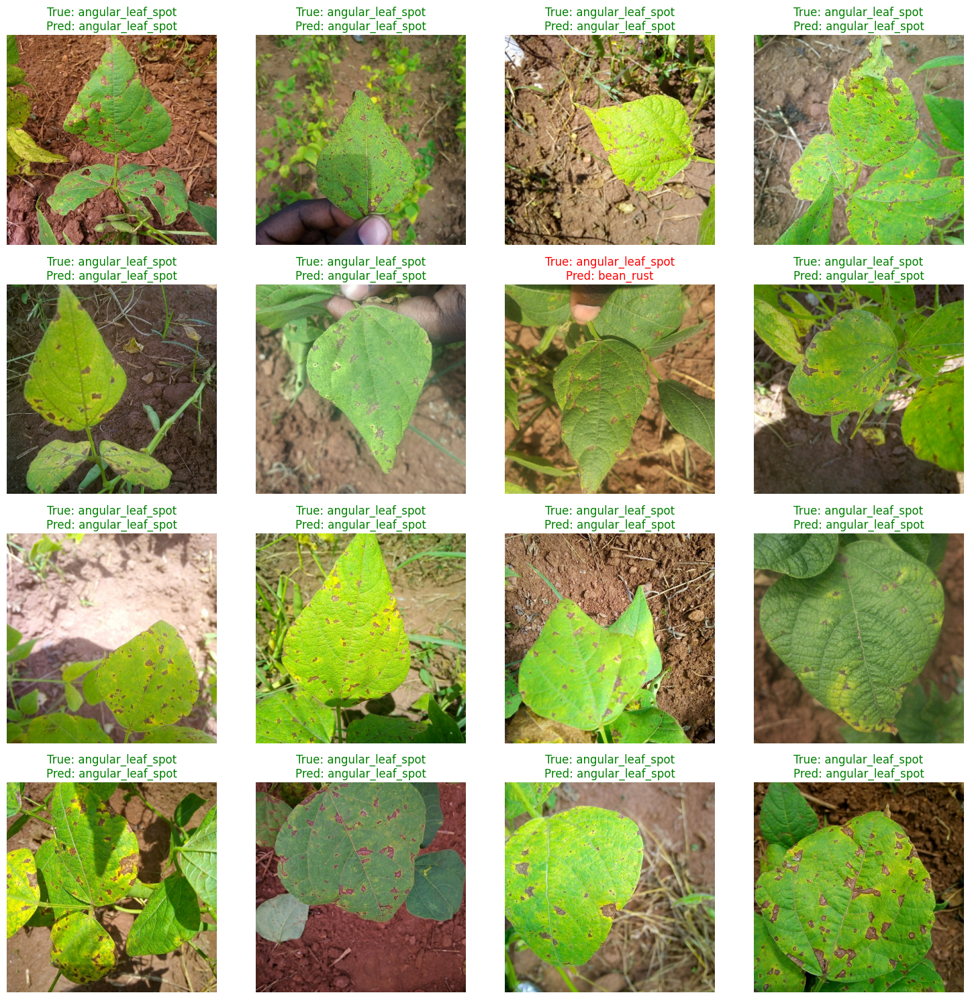

In [ ]:
import matplotlib.pyplot as plt

# Set up the plot grid
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
axes = axes.flatten()

# Iterate through the first 16 test images
for i in range(16):
    test_sample = dataset['test'][i]
    image = test_sample['image']
    true_label_id = test_sample['labels']

    # Prepare image for the model
    inputs = image_processor(image, return_tensors="pt").to(device)

    # Inference
    with torch.no_grad():
        logits = model(**inputs).logits

    # Get prediction
    predicted_label_id = logits.argmax(-1).item()
    predicted_class = id2label[str(predicted_label_id)]
    true_class = labels[true_label_id]

    # Display the image
    axes[i].imshow(image)
    axes[i].set_title(f"True: {true_class}\nPred: {predicted_class}",
                      color="green" if true_class == predicted_class else "red")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

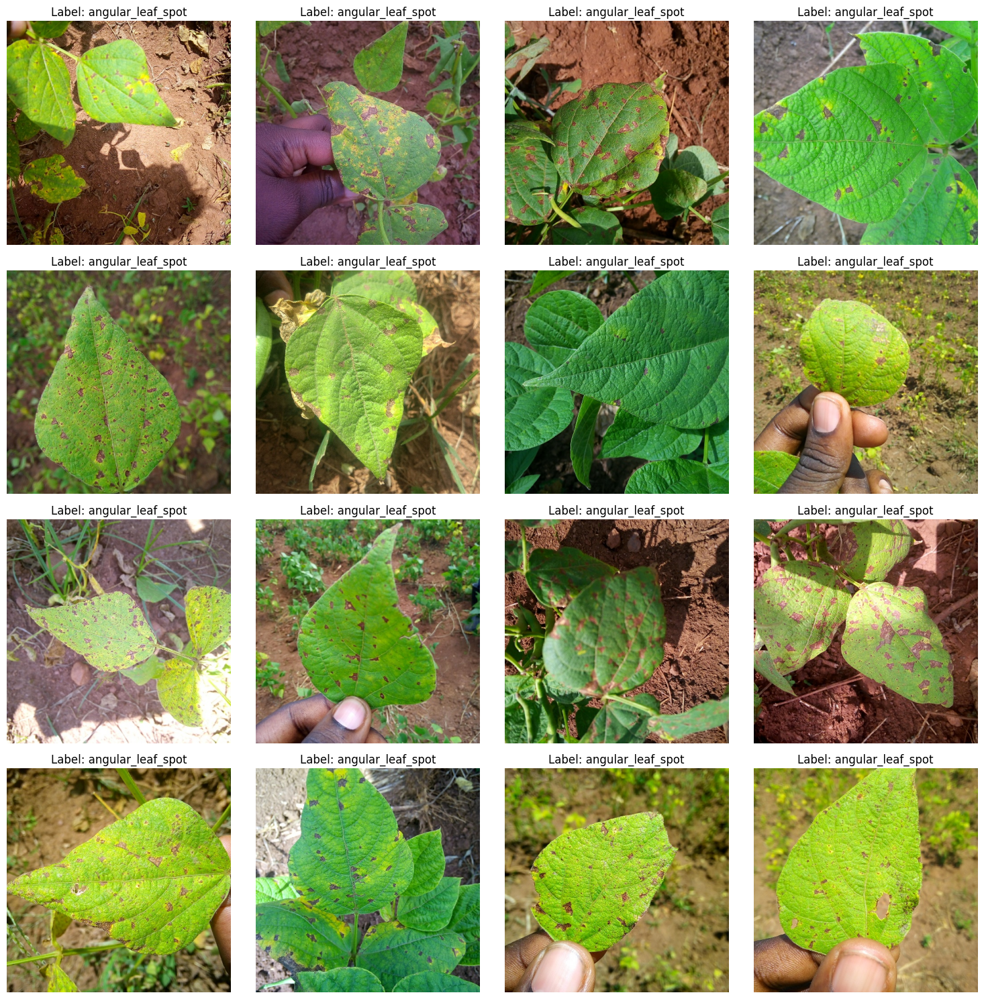

In [ ]:
import matplotlib.pyplot as plt

# Set up the plot grid for training data
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
axes = axes.flatten()

# Iterate through the first 16 training images
# Note: train_ds already has transforms applied, so we'll access the original 'image' and 'labels' from the raw dataset
for i in range(16):
    # Access the original image and label from the raw dataset to display untransformed image
    train_sample_original = dataset['train'][i]
    image = train_sample_original['image']
    true_label_id = train_sample_original['labels']
    true_class = labels[true_label_id]

    # Display the image
    axes[i].imshow(image)
    axes[i].set_title(f"Label: {true_class}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()